In [2]:
import kagglehub

# Download latest version
path = kagglehub.dataset_download("manideep1108/tusimple")

print("Path to dataset files:", path)

Using Colab cache for faster access to the 'tusimple' dataset.
Path to dataset files: /kaggle/input/tusimple


In [3]:
import os
print(os.listdir(path))


['TUSimple', 'test_label_new.json']


In [4]:
import os

img_folder = os.path.join(path, 'TUSimple')
print(os.listdir(img_folder)[:10])  # List first 10 files to see the image extensions


['test_set', 'test_label.json', 'train_set']


In [5]:
import os
from glob import glob

train_folder = os.path.join(path, 'TUSimple', 'train_set')
print(os.listdir(train_folder)[:10])  # See the extensions and sample files


['readme.md', 'clips', 'label_data_0601.json', 'label_data_0313.json', 'label_data_0531.json', 'seg_label']


In [6]:
clips_folder = os.path.join(train_folder, 'clips')
print(os.listdir(clips_folder)[:10])  # See what subfolders/files are inside “clips”


['0531', '0601', '0313-2', '0313-1']


getting into one folder

In [7]:
first_seq_folder = os.path.join(clips_folder, '0531')
print(os.listdir(first_seq_folder)[:5])  # Shows sequence folders/files


['1492629775931278791', '1492638171846277019', '1492630074847873867', '1492628703513689329', '1492637987790611349']


In [8]:
img_seq_folder = os.path.join(first_seq_folder, '1492629775931278791')
print(os.listdir(img_seq_folder)[:10])  # Shows image files, e.g. 1.jpg, 1.png, ...


['20.jpg', '6.jpg', '5.jpg', '8.jpg', '10.jpg', '9.jpg', '1.jpg', '16.jpg', '7.jpg', '13.jpg']


In [9]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
from glob import glob
import os

img_seq_folder = '/root/.cache/kagglehub/datasets/manideep1108/tusimple/TUSimple/train_set/clips/0531/1492629775931278791'
img_files = glob(f"{img_seq_folder}/*.jpg") + glob(f"{img_seq_folder}/*.png")

for img_path in img_files[:5]:  # Show 5 results
    img = cv2.imread(img_path)
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    edges = cv2.Canny(gray, 50, 150, apertureSize=3)
    lines = cv2.HoughLines(edges, 1, np.pi/180, 120)
    img_lines = img.copy()
    if lines is not None:
        for line in lines[:15]:
            rho, theta = line[0]
            deg = np.degrees(theta)
            # Filter by typical lane angles if you want cleaner results
            if (30 < deg < 70) or (110 < deg < 150):
                a = np.cos(theta)
                b = np.sin(theta)
                x0 = a*rho
                y0 = b*rho
                x1 = int(x0 + 1000*(-b))
                y1 = int(y0 + 1000*(a))
                x2 = int(x0 - 1000*(-b))
                y2 = int(y0 - 1000*(a))
                cv2.line(img_lines, (x1, y1), (x2, y2), (0,0,255), 2)
    plt.figure(figsize=(12,6))


In [10]:
for img_path in img_files[:2]:  # Try first few frames
    img = cv2.imread(img_path)
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    gray_blur = cv2.medianBlur(gray, 5)
    circles = cv2.HoughCircles(gray_blur, cv2.HOUGH_GRADIENT, dp=1.2, minDist=30,
                              param1=50, param2=30, minRadius=10, maxRadius=100)
    output = img.copy()
    if circles is not None:
        circles = np.round(circles[0, :]).astype("int")
        for (x, y, r) in circles:
            cv2.circle(output, (x, y), r, (0, 255, 0), 3)
    plt.figure(figsize=(8,6))
    plt.imshow(cv2.cvtColor(output, cv2.COLOR_BGR2RGB))
    plt.title("Hough Circle Detection")
    plt.axis('off')
    plt.show()


In [11]:
for img_path in img_files[:2]:
    img = cv2.imread(img_path)
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    ret, thresh = cv2.threshold(gray, 100, 255, cv2.THRESH_BINARY)
    contours, _ = cv2.findContours(thresh, cv2.RETR_TREE, cv2.CHAIN_APPROX_SIMPLE)
    output = img.copy()
    for cnt in contours:
        if len(cnt) >= 5:
            ellipse = cv2.fitEllipse(cnt)
            (center, axes, angle) = ellipse
            if axes[0] > 10 and axes[1] > 10:  # Only draw sensible ellipses
                cv2.ellipse(output, ellipse, (255,0,0), 2)
    plt.figure(figsize=(8,6))
    plt.imshow(cv2.cvtColor(output, cv2.COLOR_BGR2RGB))
    plt.title("Ellipse Detection")
    plt.axis('off')
    plt.show()


In [15]:
import os

# List everything in "clips" (you know this exists!)
clips_folder = os.path.join(path, 'TUSimple', 'train_set', 'clips')
print(clips_folder)
print(os.listdir(clips_folder))


/kaggle/input/tusimple/TUSimple/train_set/clips
['0531', '0601', '0313-2', '0313-1']


In [16]:
seq_folder = '/kaggle/input/tusimple/TUSimple/train_set/clips/0531'
print(os.listdir(seq_folder))  # Should show folders (the clips)


['1492629775931278791', '1492638171846277019', '1492630074847873867', '1492628703513689329', '1492637987790611349', '1492726400071868379', '1492728207489683050', '1492638159287132312', '1492637324626774571', '1492722580362784659', '1492724891810984997', '1492721902136883896', '1492727045085543815', '1492721523667719442', '1492628798053260725', '1492637051321880530', '1492727574468964690', '1492626725443010116', '1492627523591276079', '1492627490412865107', '1492630354745362275', '1492627802322466027', '1492727555613368008', '1492637777617481885', '1492638619045137162', '1492723230207987691', '1492629866940090719', '1492638387249489975', '1492635269726755796', '1492637998352388465', '1492627568830653089', '1492638154423407746', '1492627996504857213', '1492728274616145843', '1492726180535655727', '1492635232381767419', '1492721976791984959', '1492628365714746456', '1492627472055935270', '1492635837020914158', '1492729265190159870', '1492639019001427791', '1492727526930575523', '149263905

In [17]:
import os
from glob import glob

single_clip_folder = '/kaggle/input/tusimple/TUSimple/train_set/clips/0531/1492629775931278791'
print(os.listdir(single_clip_folder)[:10])  # Should show images (e.g., 1.jpg, 2.jpg, ...)
img_files = glob(f"{single_clip_folder}/*.jpg") + glob(f"{single_clip_folder}/*.png")
print(img_files[:5])


['20.jpg', '6.jpg', '5.jpg', '8.jpg', '10.jpg', '9.jpg', '1.jpg', '16.jpg', '7.jpg', '13.jpg']
['/kaggle/input/tusimple/TUSimple/train_set/clips/0531/1492629775931278791/20.jpg', '/kaggle/input/tusimple/TUSimple/train_set/clips/0531/1492629775931278791/6.jpg', '/kaggle/input/tusimple/TUSimple/train_set/clips/0531/1492629775931278791/5.jpg', '/kaggle/input/tusimple/TUSimple/train_set/clips/0531/1492629775931278791/8.jpg', '/kaggle/input/tusimple/TUSimple/train_set/clips/0531/1492629775931278791/10.jpg']


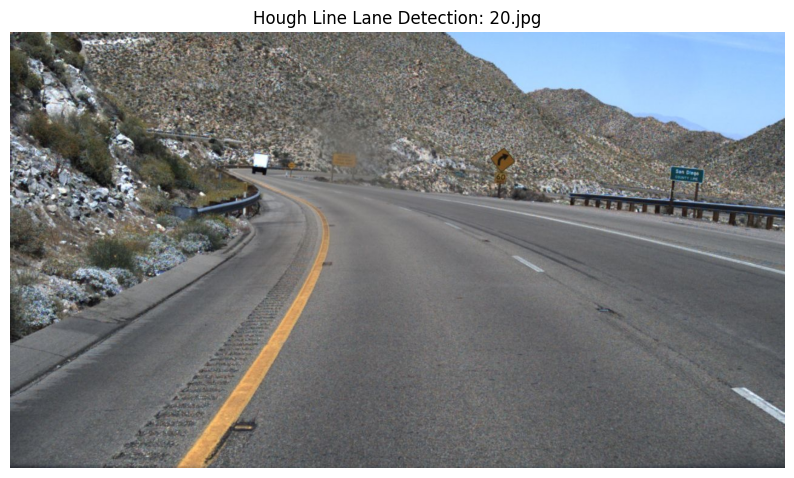

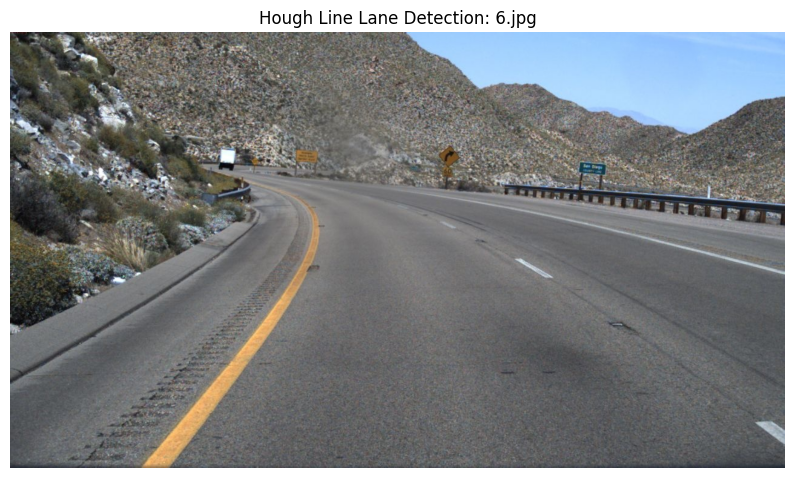

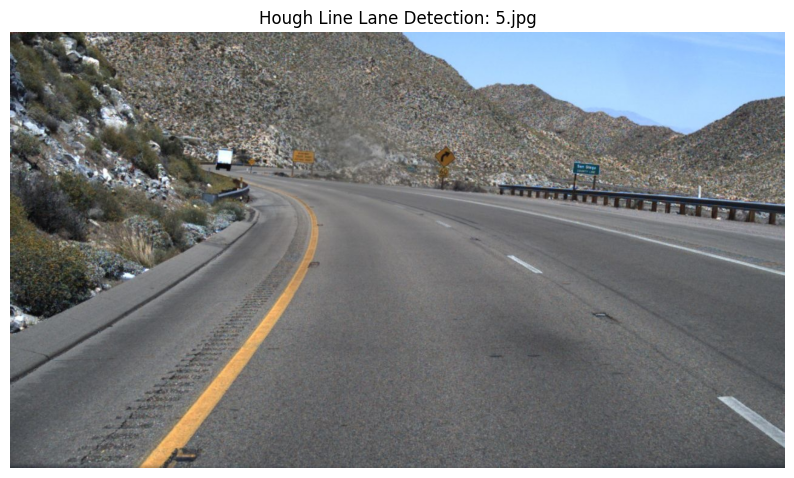

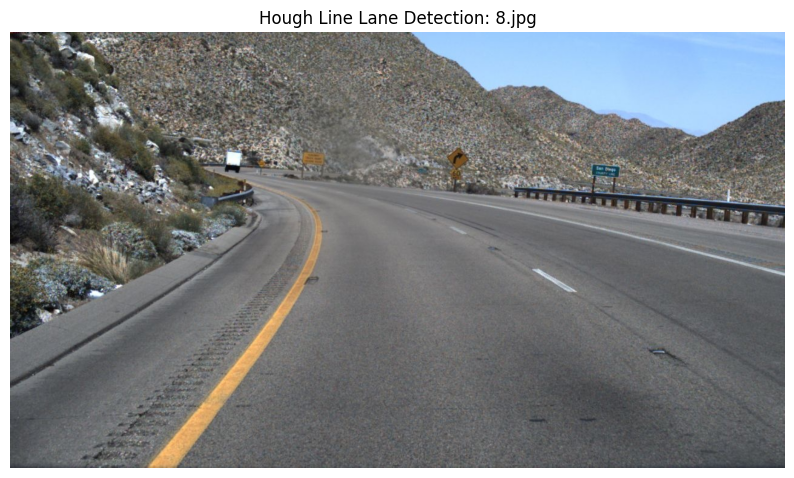

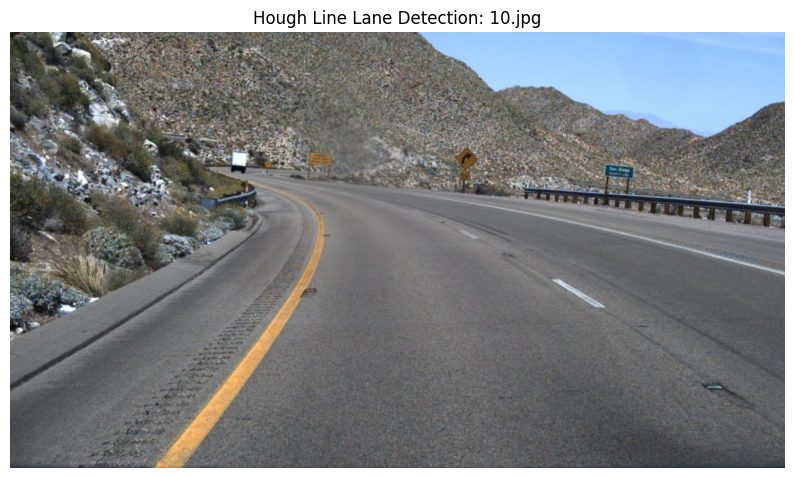

In [18]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

img_files = [
    '/kaggle/input/tusimple/TUSimple/train_set/clips/0531/1492629775931278791/20.jpg',
    '/kaggle/input/tusimple/TUSimple/train_set/clips/0531/1492629775931278791/6.jpg',
    '/kaggle/input/tusimple/TUSimple/train_set/clips/0531/1492629775931278791/5.jpg',
    '/kaggle/input/tusimple/TUSimple/train_set/clips/0531/1492629775931278791/8.jpg',
    '/kaggle/input/tusimple/TUSimple/train_set/clips/0531/1492629775931278791/10.jpg'
]

for img_path in img_files:
    img = cv2.imread(img_path)
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    edges = cv2.Canny(gray, 50, 150, apertureSize=3)
    lines = cv2.HoughLines(edges, 1, np.pi/180, 120)
    img_lines = img.copy()
    if lines is not None:
        for line in lines[:15]:
            rho, theta = line[0]
            deg = np.degrees(theta)
            if (30 < deg < 70) or (110 < deg < 150):  # Typical lane angles
                a = np.cos(theta)
                b = np.sin(theta)
                x0 = a*rho
                y0 = b*rho
                x1 = int(x0 + 1000*(-b))
                y1 = int(y0 + 1000*(a))
                x2 = int(x0 - 1000*(-b))
                y2 = int(y0 - 1000*(a))
                cv2.line(img_lines, (x1, y1), (x2, y2), (0,0,255), 2)
    plt.figure(figsize=(10,6))
    plt.imshow(cv2.cvtColor(img_lines, cv2.COLOR_BGR2RGB))
    plt.title(f"Hough Line Lane Detection: {img_path.split('/')[-1]}")
    plt.axis('off')
    plt.show()


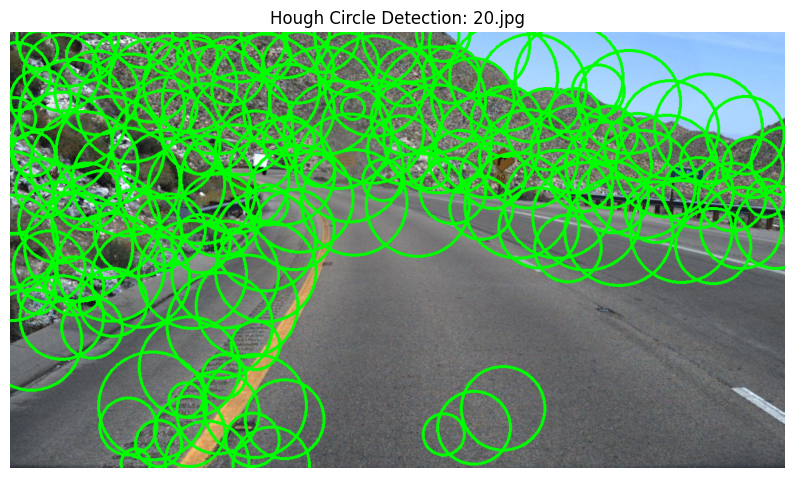

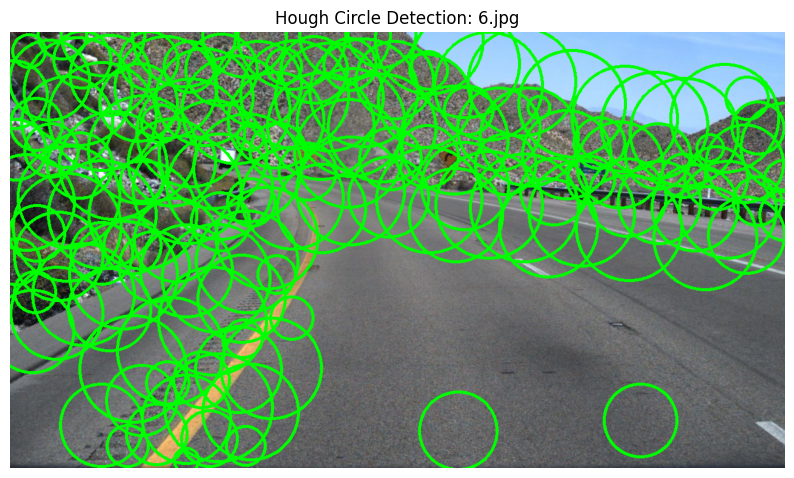

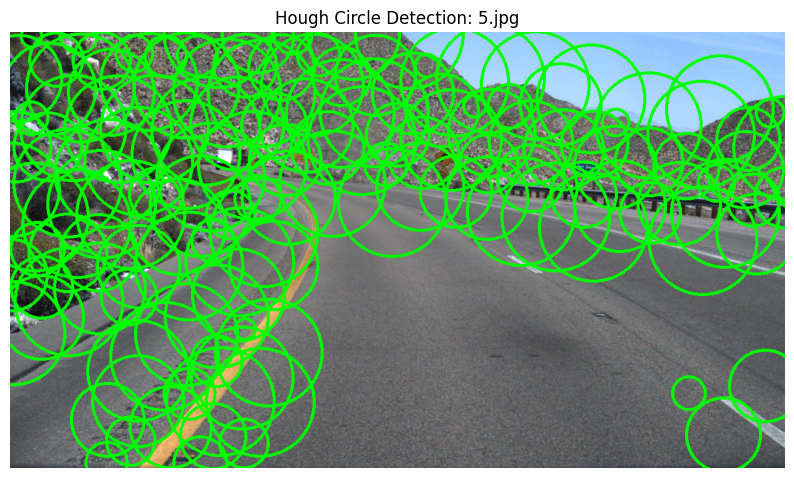

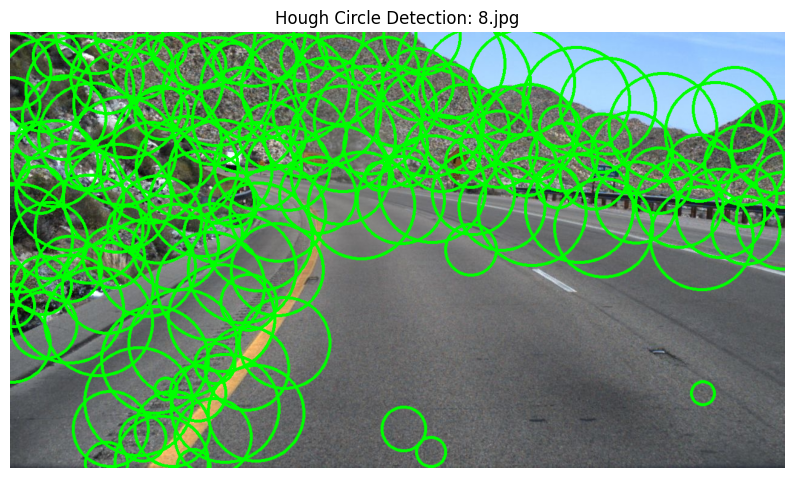

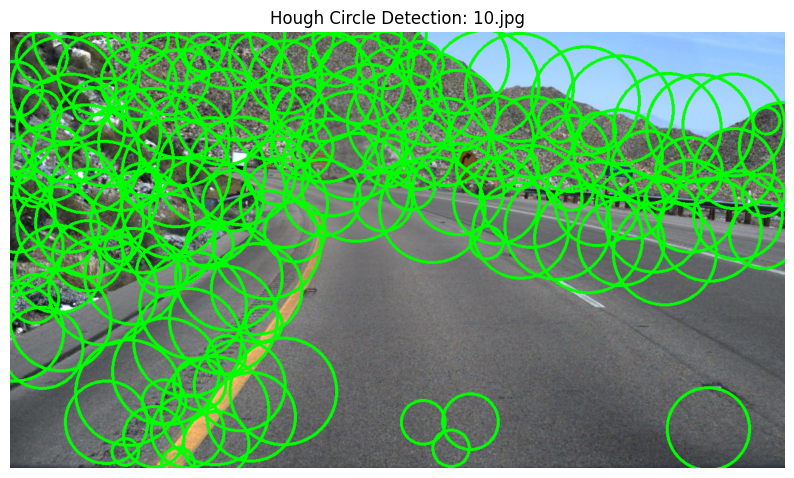

In [19]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

for img_path in img_files[:5]:  # Use your earlier loaded list of images
    img = cv2.imread(img_path)
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    gray_blur = cv2.medianBlur(gray, 5)
    circles = cv2.HoughCircles(gray_blur,
                               cv2.HOUGH_GRADIENT,
                               dp=1.2,
                               minDist=50,
                               param1=50,
                               param2=30,
                               minRadius=15,
                               maxRadius=90)
    output = img.copy()
    if circles is not None:
        circles = np.round(circles[0, :]).astype("int")
        for (x, y, r) in circles:
            cv2.circle(output, (x, y), r, (0, 255, 0), 3)
    plt.figure(figsize=(10,6))
    plt.imshow(cv2.cvtColor(output, cv2.COLOR_BGR2RGB))
    plt.title(f"Hough Circle Detection: {img_path.split('/')[-1]}")
    plt.axis('off')
    plt.show()


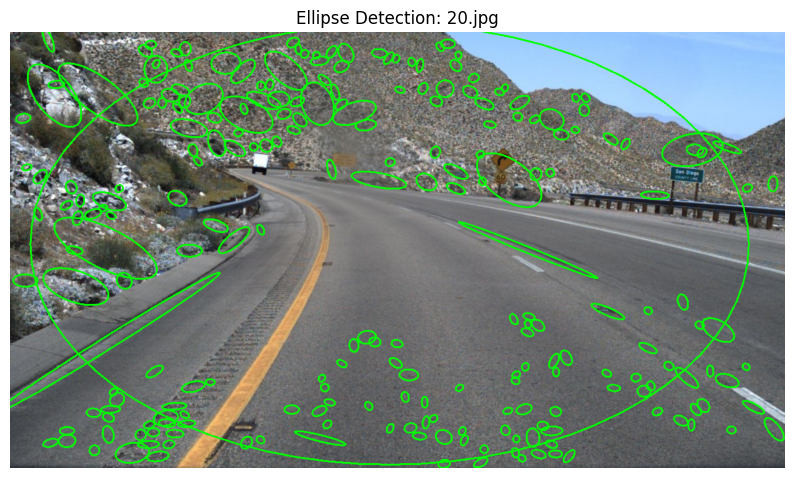

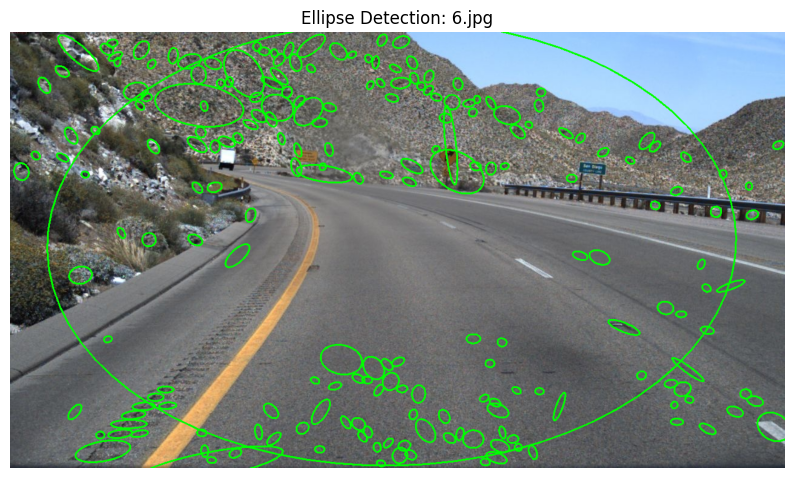

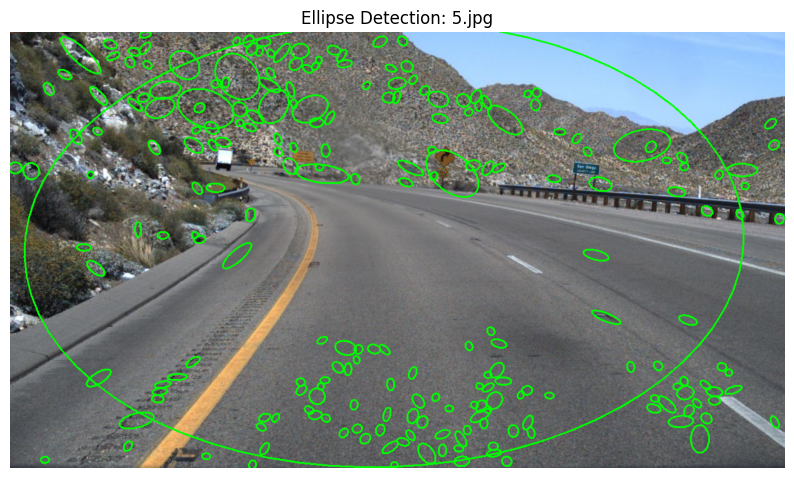

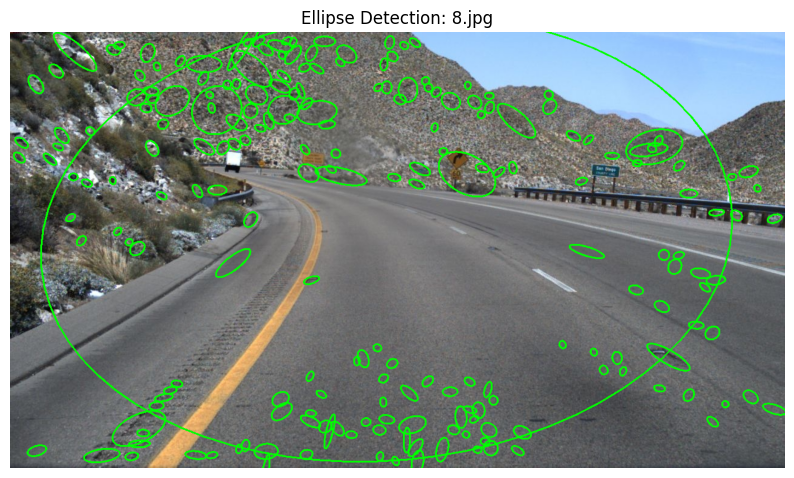

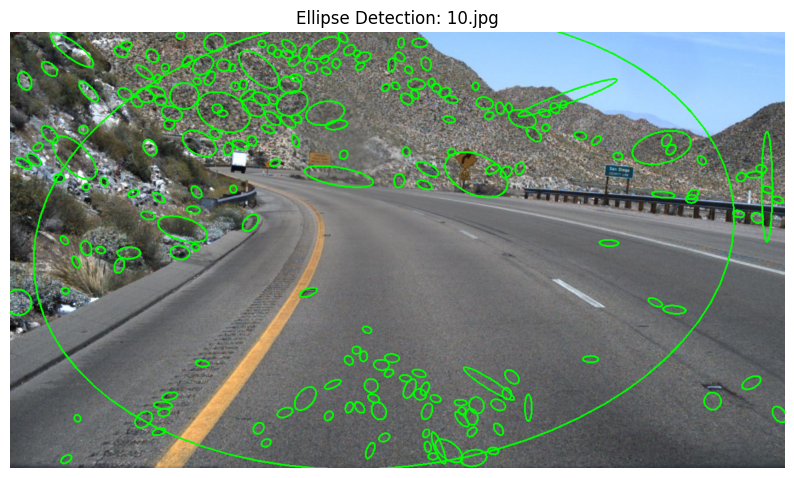

In [20]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

for img_path in img_files[:5]:
    img = cv2.imread(img_path)
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    ret, thresh = cv2.threshold(gray, 100, 255, cv2.THRESH_BINARY)
    contours, _ = cv2.findContours(thresh, cv2.RETR_TREE, cv2.CHAIN_APPROX_SIMPLE)
    output = img.copy()
    for cnt in contours:
        if len(cnt) >= 5:
            ellipse = cv2.fitEllipse(cnt)
            (center, axes, angle) = ellipse
            # Only draw 'realistic' ellipses (avoid degenerate fits)
            if axes[0] > 10 and axes[1] > 10:
                cv2.ellipse(output, ellipse, (0,255,0), 2)
    plt.figure(figsize=(10,6))
    plt.imshow(cv2.cvtColor(output, cv2.COLOR_BGR2RGB))
    plt.title(f"Ellipse Detection: {img_path.split('/')[-1]}")
    plt.axis('off')
    plt.show()


In [23]:
img = cv2.imread(img_files[0])
# Crop x=500, y=300, width=64, height=64 (adjust as needed for a distinct part!)
x, y, w, h = 500, 300, 64, 64
template = img[y:y+h, x:x+w]
cv2.imwrite('template.jpg', template)


True

In [24]:
template_gray = cv2.cvtColor(template, cv2.COLOR_BGR2GRAY)


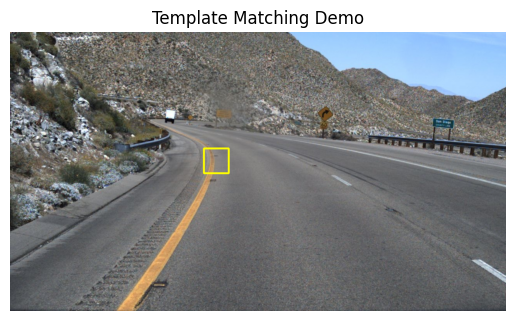

In [25]:
img_gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
result = cv2.matchTemplate(img_gray, template_gray, cv2.TM_CCOEFF_NORMED)

min_val, max_val, min_loc, max_loc = cv2.minMaxLoc(result)
(top_left_x, top_left_y) = max_loc
cv2.rectangle(img, (top_left_x, top_left_y), (top_left_x + w, top_left_y + h), (0,255,255), 3)
plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
plt.title("Template Matching Demo")
plt.axis('off')
plt.show()
